In [25]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import numpy as np
from sklearn import metrics
import sklearn.metrics as skm

70% train data
15% validation data
15% test data

In [26]:
def imagePreprocess(file):
    train_ds, val_ds = tf.keras.preprocessing.image_dataset_from_directory(
        file,
        validation_split=0.3,
        subset="both",
        seed=123,
        image_size=(256, 256),
        batch_size=32
    )
    class_name = train_ds.class_names
    test_ds = val_ds.take(int(0.15*len(val_ds)))
    val_ds = val_ds.skip(int(0.15*len(val_ds)))
    train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)
    val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)
    test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)
    return train_ds, val_ds, test_ds, class_name

In [27]:
def printData(dataset, class_name):
    plt.figure(figsize=(10, 10))
    for image_batch, image_label in dataset.take(1):
        for i in range(16):
            plt.subplot(4, 4, i+1)
            plt.imshow(image_batch[i].numpy().astype("uint8"))
            plt.title(class_name[image_label[i]])
            plt.axis("off")

In [28]:
#train_ds, val_ds, test_ds, class_name = imagePreprocess("./PlantVillage/")

In [29]:
#printData(train_ds, class_name)

Data Augmentation:
1. Resize the image to (256, 256)
2. Normalize the intensity of images between 0 and 1
3. Random flip the image horizontally and vertically
4. Random rotate the image
5. Random zoom in or zoom out the image, which changes the image sizes
Note step 3 to 5 can increase the training image sample size   

In [30]:
def dataAug():
    resize_and_rescale = tf.keras.Sequential([
        layers.experimental.preprocessing.Resizing(256, 256),
        layers.experimental.preprocessing.Rescaling(1.0/255)
    ])
    data_augmentation = tf.keras.Sequential([
        tf.keras.layers.RandomFlip("horizontal_and_vertical"),
        tf.keras.layers.RandomRotation(0.3),
        tf.keras.layers.RandomZoom(0.1)
    ])
    return resize_and_rescale, data_augmentation

In [31]:
#resize_and_rescale, data_augmentation = dataAug()

The first model:

In [32]:
def simpleModel(train_ds, val_ds, class_name, epoch):
    resize_and_rescale, data_augmentation = dataAug()
    model = tf.keras.Sequential([
        resize_and_rescale,
        data_augmentation,
        layers.Conv2D(32, (3,3), activation='relu', input_shape = (256, 256)),
        layers.MaxPooling2D((2,2)),
        layers.Conv2D(64, kernel_size = (3,3), activation = 'relu'),
        layers.MaxPooling2D((2,2)),
        layers.Dropout(0.3),
        layers.Conv2D(64, (3,3), activation='relu'),
        layers.MaxPooling2D((2,2)),
        layers.Conv2D(64, (3,3), activation='relu'),
        layers.MaxPooling2D((2,2)),
        layers.Dropout(0.3),
        layers.Conv2D(64, (3,3), activation='relu'),
        layers.MaxPooling2D((2,2)),
        layers.Conv2D(64, (3,3), activation='relu'),
        layers.MaxPooling2D((2,2)),
        layers.Dropout(0.3),
        layers.Flatten(),
        layers.Dense(64, activation='relu'),
        layers.Dense(len(class_name), activation='softmax')
    ])
    model.build(input_shape=(32, 256, 256, 3))
    model.summary()
    model.compile(
        optimizer="adam",
        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        metrics=['accuracy']
    )
    history = model.fit(
        train_ds,
        epochs = epoch,
        batch_size = 32,
        verbose = 1,
        validation_data=val_ds
    )
    return model, history

In [34]:
def VGG19Model(train_ds, val_ds, class_name, epoch):
    base_model = tf.keras.applications.VGG19(include_top= False, weights="imagenet", input_shape=(256, 256, 3))
    base_model.trainable = False
    resize_and_rescale, data_augmentation = dataAug()
    model = tf.keras.Sequential([
        resize_and_rescale,
        data_augmentation,
        base_model,
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(64, activation="relu"),
        tf.keras.layers.Dense(len(class_name), activation = "softmax")
    ])
    model.build(input_shape=(32, 256, 256, 3))
    model.summary()
    model.compile(
        optimizer="adam",
        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        metrics=["accuracy"]
    )
    history = model.fit(
        train_ds,
        epochs=epoch,
        validation_data=val_ds,
        batch_size=32,
        verbose=1
    )
    return model, history
    

In [35]:
def simpleModel2(train_ds, val_ds, class_name, epoch):
    resize_and_rescale, data_augmentation = dataAug()
    model = tf.keras.Sequential([
        resize_and_rescale,
        data_augmentation,
        tf.keras.layers.Conv2D(32, (3, 3), activation="relu", input_shape = (256, 256)),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(64, (3, 3), activation="relu"),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(64, (3, 3), activation="relu"),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(64, activation = "relu"),
        tf.keras.layers.Dense(len(class_name), activation = "softmax")
    ])
    model.build(input_shape=(32, 256, 256, 3))
    model.summary()
    model.compile(
        optimizer="adam",
        loss=tf.keras.losses.SparseCategoricalCrossentropy(),
        metrics=["accuracy"]
    )
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        batch_size=32,
        verbose=1,
        epochs=epoch
    )
    return model, history

In [50]:
def simpleModel3(train_ds, val_ds, class_name, epoch):
    resize_and_rescale, data_augmentation = dataAug()
    resize_and_rescale = tf.keras.Sequential([
        tf.keras.layers.experimental.preprocessing.Resizing(128, 128),
        tf.keras.layers.experimental.preprocessing.Rescaling(1.0/128)
    ])
    model = tf.keras.Sequential([
        resize_and_rescale,
        data_augmentation,
        tf.keras.layers.Conv2D(16, (3, 3), activation="relu", input_shape = (128, 128)),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(16, (3, 3), activation="relu"),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(32, (3, 3), activation="relu"),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(64, activation = "relu"),
        tf.keras.layers.Dense(len(class_name), activation = "softmax")
    ])
    model.build(input_shape=(32, 128, 128, 3))
    model.summary()
    model.compile(
        optimizer="adam",
        loss=tf.keras.losses.SparseCategoricalCrossentropy(),
        metrics=["accuracy"]
    )
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        batch_size=32,
        verbose=1,
        epochs=epoch
    )
    return model, history

In [37]:
def simpleModel4(train_ds, val_ds, class_name, epoch):
    resize_and_rescale, data_augmentation = dataAug()
    model = tf.keras.Sequential([
        resize_and_rescale,
        data_augmentation,
        tf.keras.layers.Conv2D(16, (3, 3), activation="relu", input_shape = (256, 256)),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(16, (3, 3), activation="relu"),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(16, (3, 3), activation="relu"),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(16, (3, 3), activation="relu"),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(16, (3, 3), activation="relu"),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(32, activation = "relu"),
        tf.keras.layers.Dense(len(class_name), activation = "softmax")
    ])
    model.build(input_shape=(32, 256, 256, 3))
    model.summary()
    model.compile(
        optimizer="adam",
        loss=tf.keras.losses.SparseCategoricalCrossentropy(),
        metrics=["accuracy"]
    )
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        batch_size=32,
        verbose=1,
        epochs=epoch
    )
    return model, history

In [ ]:
def simpleModel5(train_ds, val_ds, class_name, epoch):
    resize_and_rescale, data_augmentation = dataAug();
    model = tf.keras.Sequential([
        resize_and_rescale,
        data_augmentation,
        tf.keras.layers.Conv2D(16, (3,3), activation="relu", input_shape = (256, 256)),
        tf.keras.layers.MaxPooling2D(),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(32, (3,3), activation="relu"),
        tf.keras.layers.MaxPooling2D(),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(64, (3,3), activation="relu"),
        tf.keras.layers.MaxPooling2D(),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(128, (3, 3), activation="relu"),
        tf.keras.layers.MaxPooling2D(),
        tf.keras.layers.Dropout(0.3)
    ])
    model.build(input_shape=(32, 256, 256, 3))
    model.summary()
    model.compile(
        optimizer="adam",
        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        metrics=["accuracy"]
    )
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        batch_size=32,
        verbose=1,
        epochs=epoch
    )
    return model, history

In [38]:
#model, history = simpleModel(train_ds, val_ds, class_name, 15)

Evaluate the accuracy and loss of the model

In [39]:
def evaluateModel(history, epoch = 15):
    acc = history.history["accuracy"]
    val_acc = history.history["val_accuracy"]
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    plt.figure(figsize=(8, 8))
    plt.subplot(2,1,2)
    plt.plot(range(epoch), acc, label = "Training Accuracy")
    plt.plot(range(epoch), val_acc, label = "Validation Accuracy")
    plt.legend(loc = 'lower right')
    plt.title("Training and Validation Accuracy")
    plt.show()
    
    plt.subplot(2, 1, 2)
    plt.plot(range(epoch), loss, label = "Training Loss")
    plt.plot(range(epoch), val_loss, label = "Validation Loss")
    plt.legend(loc = "upper right")
    plt.title("Training and Validation Loss")
    plt.show()
    

In [40]:
#evaluateModel(history, 15)

Predict image with certain model

In [41]:
def predict(model, img, class_name):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    predictions = model.predict(img_array)
    predicted_class = class_name[np.argmax(predictions[0])]
    confidence = round(100*(np.max(predictions[0])), 2)
    return predicted_class, confidence

Evaluate the model with test data

In [42]:
def evaluateModelCon(test_ds, model, class_name):
    predicted = []
    true = []

    for images, labels in test_ds.take(5):
        for i in range(len(images)):
            predicted_class, confidence = predict(model, images[i].numpy(), class_name)
            actual_class = class_name[labels[i]]
            predicted.append(predicted_class)
            true.append(actual_class)
    
    matrix = skm.multilabel_confusion_matrix(true, predicted)
    print(matrix)
    print( skm.classification_report(true,predicted))
    
    metrics.ConfusionMatrixDisplay.from_predictions(
        y_true=true, y_pred=predicted, labels=class_name, xticks_rotation="vertical"
    )

In [43]:
#evaluateModelCon(test_ds, model, class_name)

Print the predicted results

In [44]:
def printPredict(test_ds, class_name, model):
    plt.figure(figsize=(15, 15))
    for images, labels in test_ds.take(1):
        for i in range(9):
            ax = plt.subplot(3, 3, i+1)
            plt.imshow(images[i].numpy().astype("uint8"))
        
            predicted_class, confidence = predict(model, images[i].numpy(), class_name)
            actual_class = class_name[labels[i]]
            plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
            plt.axis("off")

In [45]:
#printPredict(test_ds, class_name, model)

Finish all the process in a single function

In [46]:
def generalModel(file, m = 0, e = 15):
    train_ds, val_ds, test_ds, class_name = imagePreprocess(file)
    if m == 1:
        model, history = simpleModel(train_ds, val_ds, class_name, e)
    elif m == 2:
        model, history = simpleModel2(train_ds, val_ds, class_name, e)
    elif m == 3:
        model, history = simpleModel3(train_ds, val_ds, class_name, e)
    elif m == 4:
        model, history = simpleModel4(train_ds, val_ds, class_name, e)
    elif m == 5:
        model, history = MobileNetV2Model(train_ds, val_ds, class_name, e)
    elif m == 6:
        model, history = VGG19Model(train_ds, val_ds, class_name, e)
    else:
        model, history = simpleModel5(train_ds, val_ds, class_name, e)
    evaluateModel(history, 15)
    evaluateModelCon(test_ds, model, class_name)
    printPredict(test_ds, class_name, model)

Found 2152 files belonging to 3 classes.
Using 1507 files for training.
Using 645 files for validation.
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_6 (Sequential)   (32, 256, 256, 3)         0         
                                                                 
 sequential_7 (Sequential)   (32, 256, 256, 3)         0         
                                                                 
 conv2d_9 (Conv2D)           (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d_9 (MaxPooling  (32, 127, 127, 32)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1

                                                                 
 conv2d_13 (Conv2D)          (32, 12, 12, 64)          36928     
                                                                 
 max_pooling2d_13 (MaxPoolin  (32, 6, 6, 64)           0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (32, 4, 4, 64)            36928     
                                                                 
 max_pooling2d_14 (MaxPoolin  (32, 2, 2, 64)           0         
 g2D)                                                            
                                                                 
 dropout_8 (Dropout)         (32, 2, 2, 64)            0         
                                                                 
 flatten_2 (Flatten)         (32, 256)                 0         
                                                                 
 dense_4 (

c:\Users\x2421\miniconda3\envs\tf\lib\site-packages\keras\backend.py:5582: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


48/48 [==============================] - 35s 650ms/step - loss: 0.9214 - accuracy: 0.4612 - val_loss: 0.9182 - val_accuracy: 0.6721
Epoch 2/15
48/48 [==============================] - 30s 634ms/step - loss: 0.7688 - accuracy: 0.6218 - val_loss: 0.8033 - val_accuracy: 0.6175
Epoch 3/15
48/48 [==============================] - 30s 633ms/step - loss: 0.5944 - accuracy: 0.7498 - val_loss: 0.7170 - val_accuracy: 0.7286
Epoch 4/15
48/48 [==============================] - 31s 640ms/step - loss: 0.4641 - accuracy: 0.8169 - val_loss: 0.8833 - val_accuracy: 0.6248
Epoch 5/15
48/48 [==============================] - 30s 636ms/step - loss: 0.3799 - accuracy: 0.8421 - val_loss: 0.2612 - val_accuracy: 0.9016
Epoch 6/15
48/48 [==============================] - 31s 637ms/step - loss: 0.3079 - accuracy: 0.8759 - val_loss: 0.5019 - val_accuracy: 0.7395
Epoch 7/15
48/48 [==============================] - 30s 629ms/step - loss: 0.2493 - accuracy: 0.9011 - val_loss: 0.4908 - val_accuracy: 0.7960
Epoch 8/15

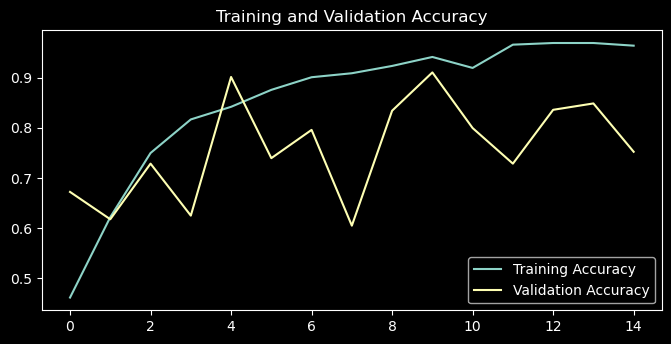

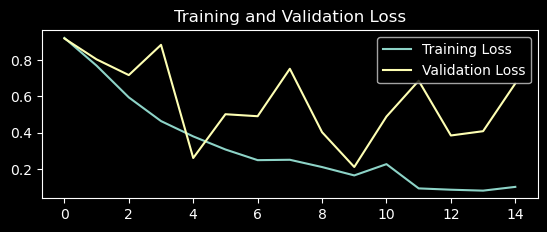

1/1 [==============================] - 0s 31ms/step
[[[47  1]
  [10 38]]

 [[51  1]
  [12 32]]

 [[72 20]
  [ 0  4]]]
                       precision    recall  f1-score   support

Potato___Early_blight       0.97      0.79      0.87        48
 Potato___Late_blight       0.97      0.73      0.83        44
     Potato___healthy       0.17      1.00      0.29         4

             accuracy                           0.77        96
            macro avg       0.70      0.84      0.66        96
         weighted avg       0.94      0.77      0.83        96

1/1 [==============================] - 0s 30ms/step


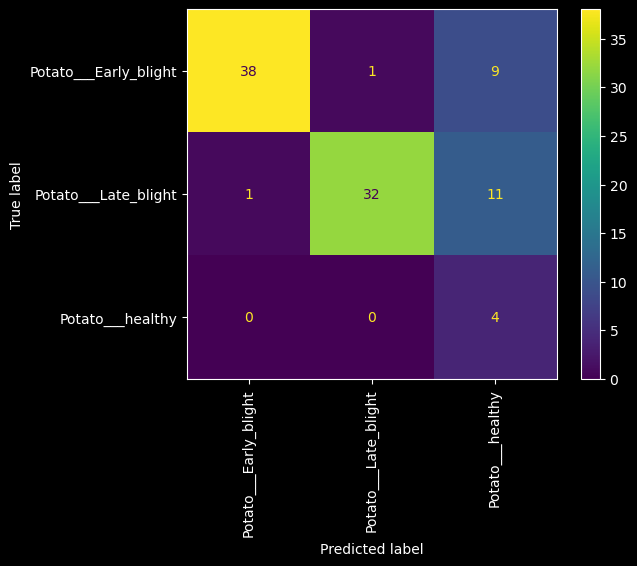

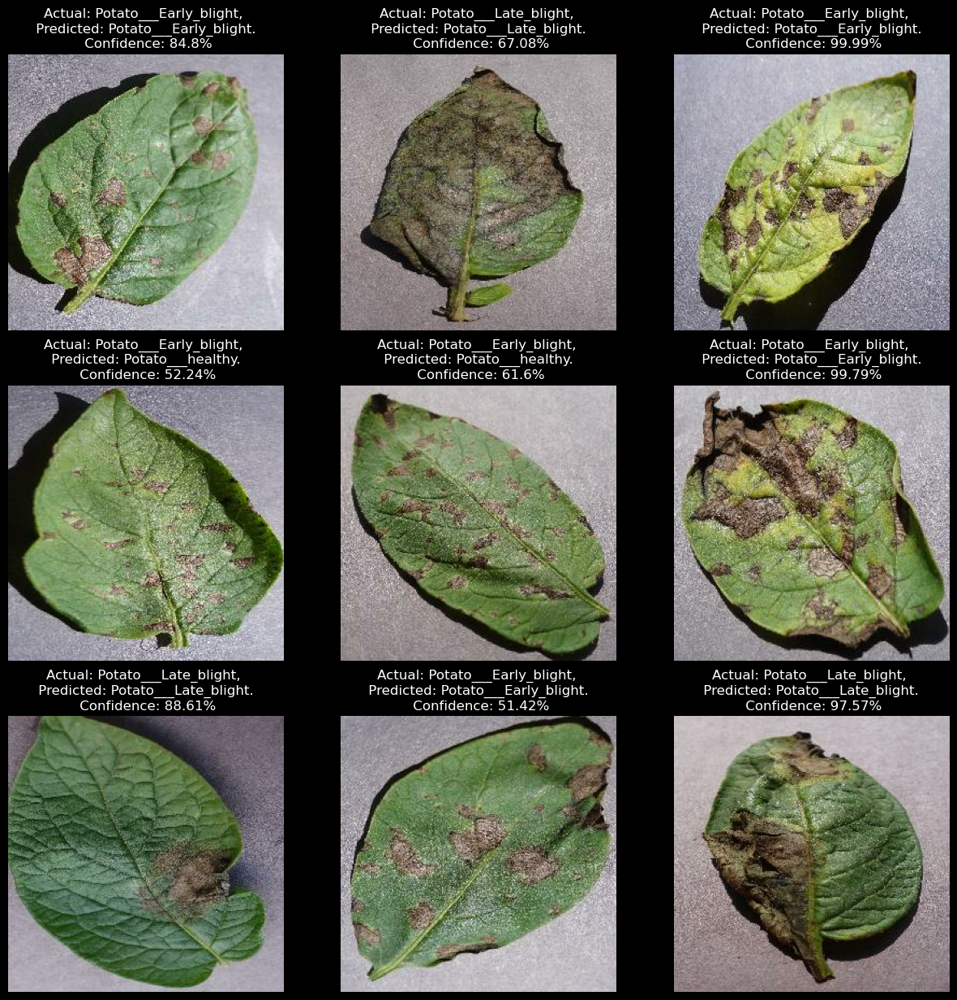

In [47]:
generalModel("./PlantVillage/", 1, 15)

Found 2152 files belonging to 3 classes.
Using 1507 files for training.
Using 645 files for validation.
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_9 (Sequential)   (32, 256, 256, 3)         0         
                                                                 
 sequential_10 (Sequential)  (32, 256, 256, 3)         0         
                                                                 
 conv2d_15 (Conv2D)          (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d_15 (MaxPoolin  (32, 127, 127, 32)       0         
 g2D)                                                            
                                                                 
 dropout_9 (Dropout)         (32, 127, 127, 32)        0         
                                                                 
 conv2d_16 (Con

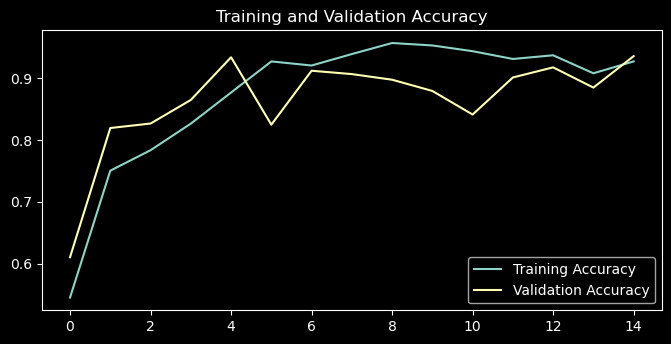

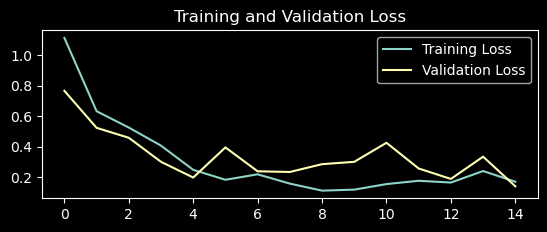

1/1 [==============================] - 0s 28ms/step
[[[46  2]
  [ 0 48]]

 [[52  0]
  [ 5 39]]

 [[89  3]
  [ 0  4]]]
                       precision    recall  f1-score   support

Potato___Early_blight       0.96      1.00      0.98        48
 Potato___Late_blight       1.00      0.89      0.94        44
     Potato___healthy       0.57      1.00      0.73         4

             accuracy                           0.95        96
            macro avg       0.84      0.96      0.88        96
         weighted avg       0.96      0.95      0.95        96

1/1 [==============================] - 0s 19ms/step


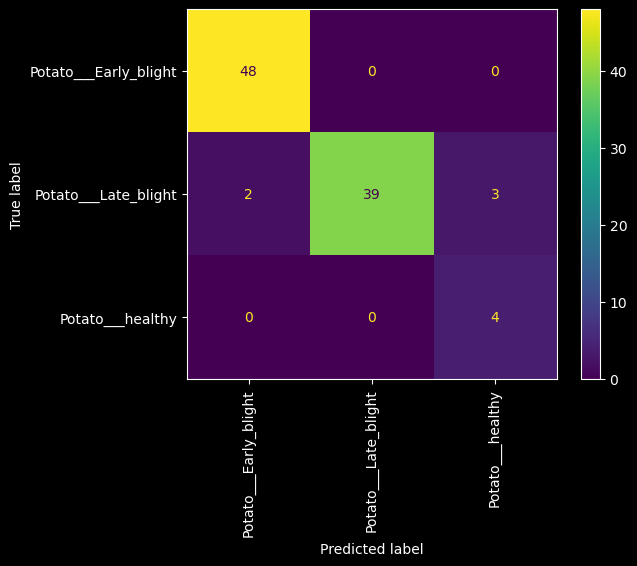

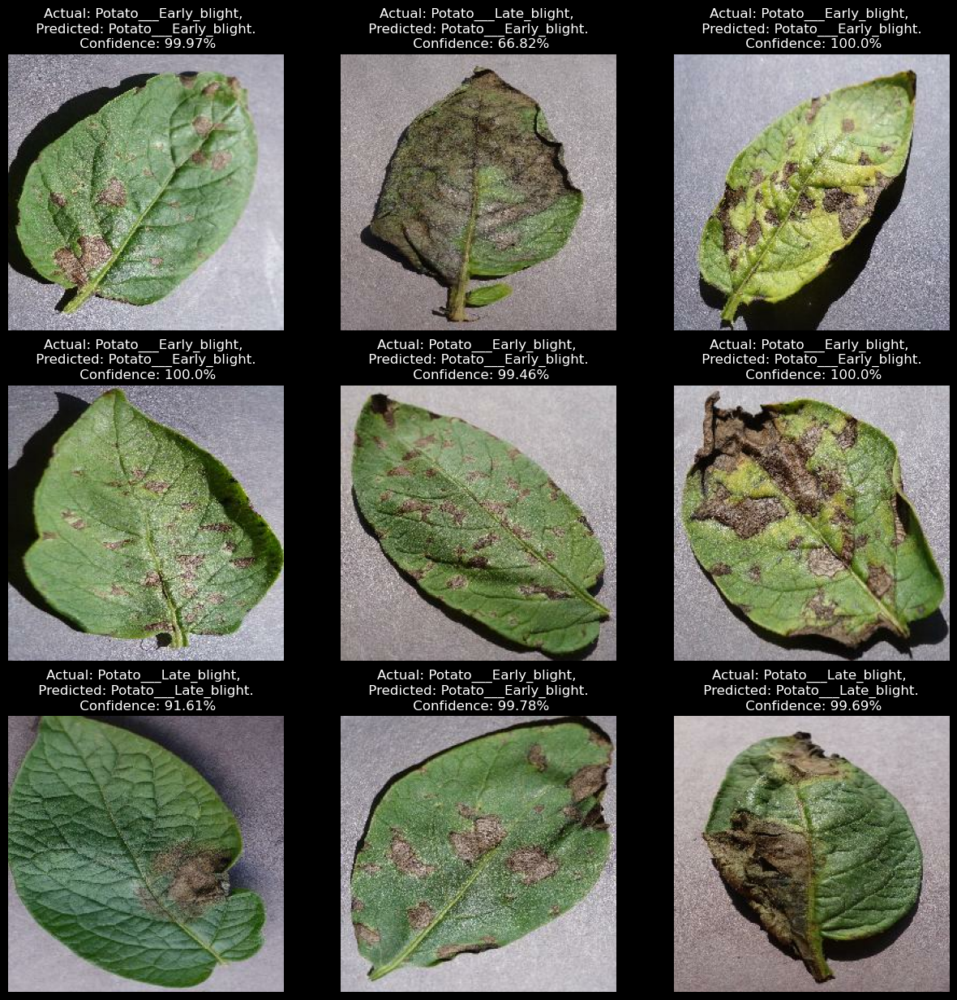

In [48]:
generalModel("./PlantVillage/", 2, 15)

Found 2152 files belonging to 3 classes.
Using 1507 files for training.
Using 645 files for validation.
Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_16 (Sequential)  (32, 128, 128, 3)         0         
                                                                 
 sequential_15 (Sequential)  (32, 128, 128, 3)         0         
                                                                 
 conv2d_18 (Conv2D)          (32, 126, 126, 16)        448       
                                                                 
 max_pooling2d_18 (MaxPoolin  (32, 63, 63, 16)         0         
 g2D)                                                            
                                                                 
 dropout_12 (Dropout)        (32, 63, 63, 16)          0         
                                                                 
 conv2d_19 (Con

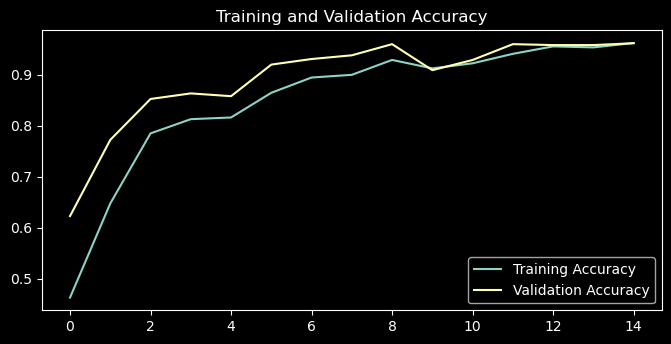

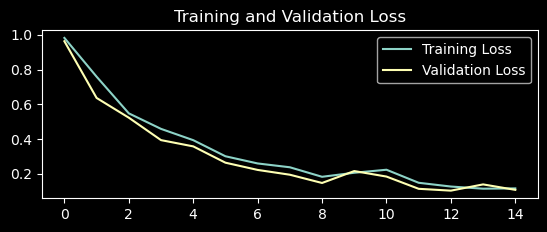

1/1 [==============================] - 0s 23ms/step
[[[47  1]
  [ 1 47]]

 [[50  2]
  [ 2 42]]

 [[91  1]
  [ 1  3]]]
                       precision    recall  f1-score   support

Potato___Early_blight       0.98      0.98      0.98        48
 Potato___Late_blight       0.95      0.95      0.95        44
     Potato___healthy       0.75      0.75      0.75         4

             accuracy                           0.96        96
            macro avg       0.89      0.89      0.89        96
         weighted avg       0.96      0.96      0.96        96

1/1 [==============================] - 0s 21ms/step


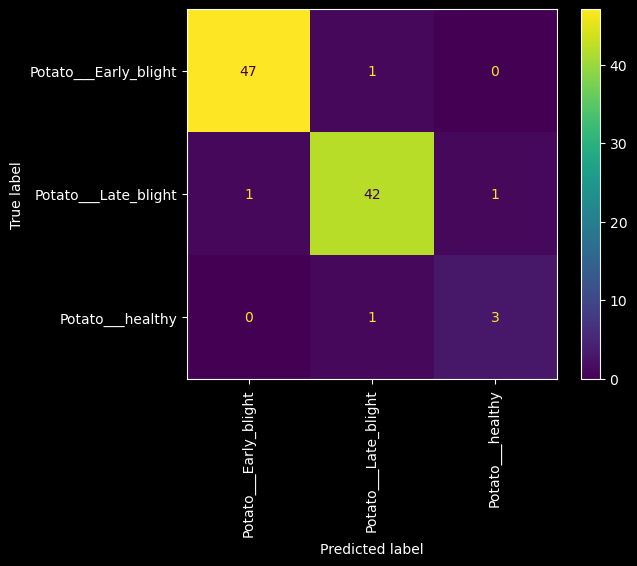

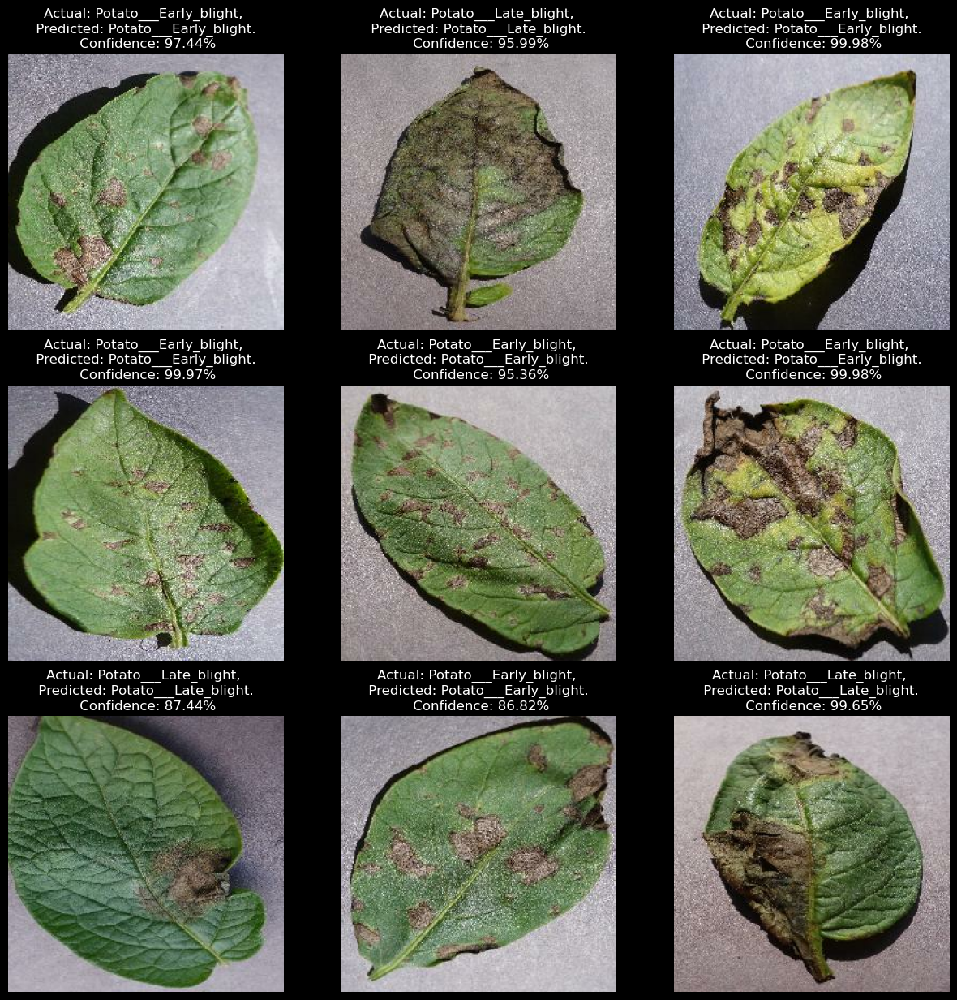

In [51]:
generalModel("./PlantVillage/", 3, 15)

Found 2152 files belonging to 3 classes.
Using 1507 files for training.
Using 645 files for validation.
Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_18 (Sequential)  (32, 256, 256, 3)         0         
                                                                 
 sequential_19 (Sequential)  (32, 256, 256, 3)         0         
                                                                 
 conv2d_21 (Conv2D)          (32, 254, 254, 16)        448       
                                                                 
 max_pooling2d_21 (MaxPoolin  (32, 127, 127, 16)       0         
 g2D)                                                            
                                                                 
 dropout_15 (Dropout)        (32, 127, 127, 16)        0         
                                                                 
 conv2d_22 (Con

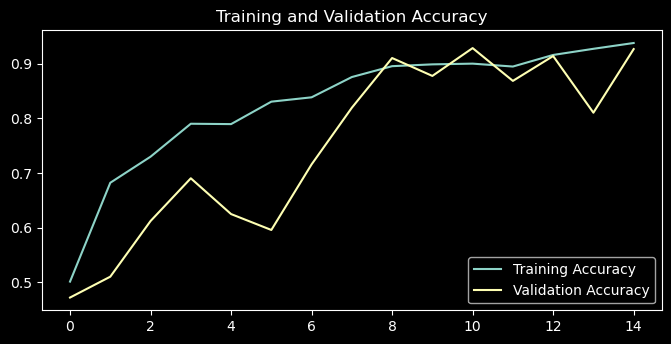

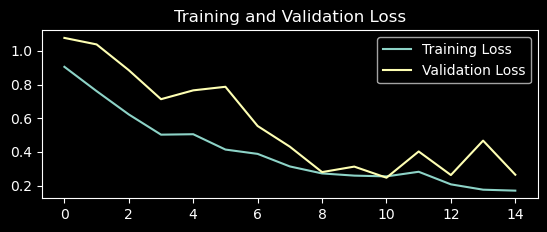

1/1 [==============================] - 0s 23ms/step
[[[47  1]
  [ 2 46]]

 [[50  2]
  [ 3 41]]

 [[90  2]
  [ 0  4]]]
                       precision    recall  f1-score   support

Potato___Early_blight       0.98      0.96      0.97        48
 Potato___Late_blight       0.95      0.93      0.94        44
     Potato___healthy       0.67      1.00      0.80         4

             accuracy                           0.95        96
            macro avg       0.87      0.96      0.90        96
         weighted avg       0.95      0.95      0.95        96

1/1 [==============================] - 0s 21ms/step


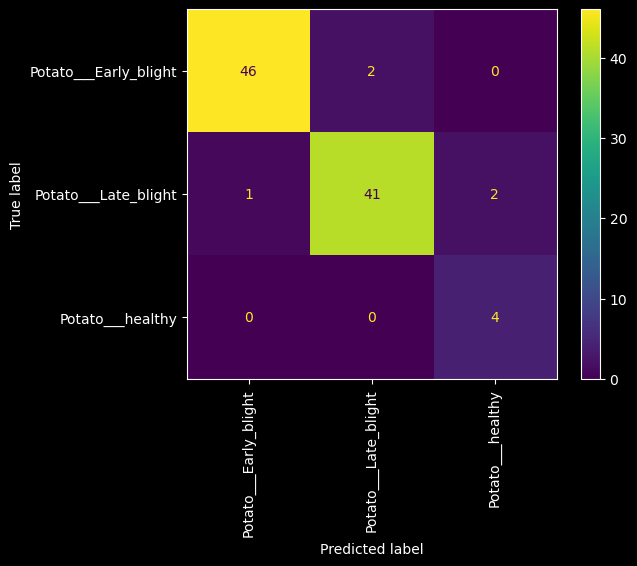

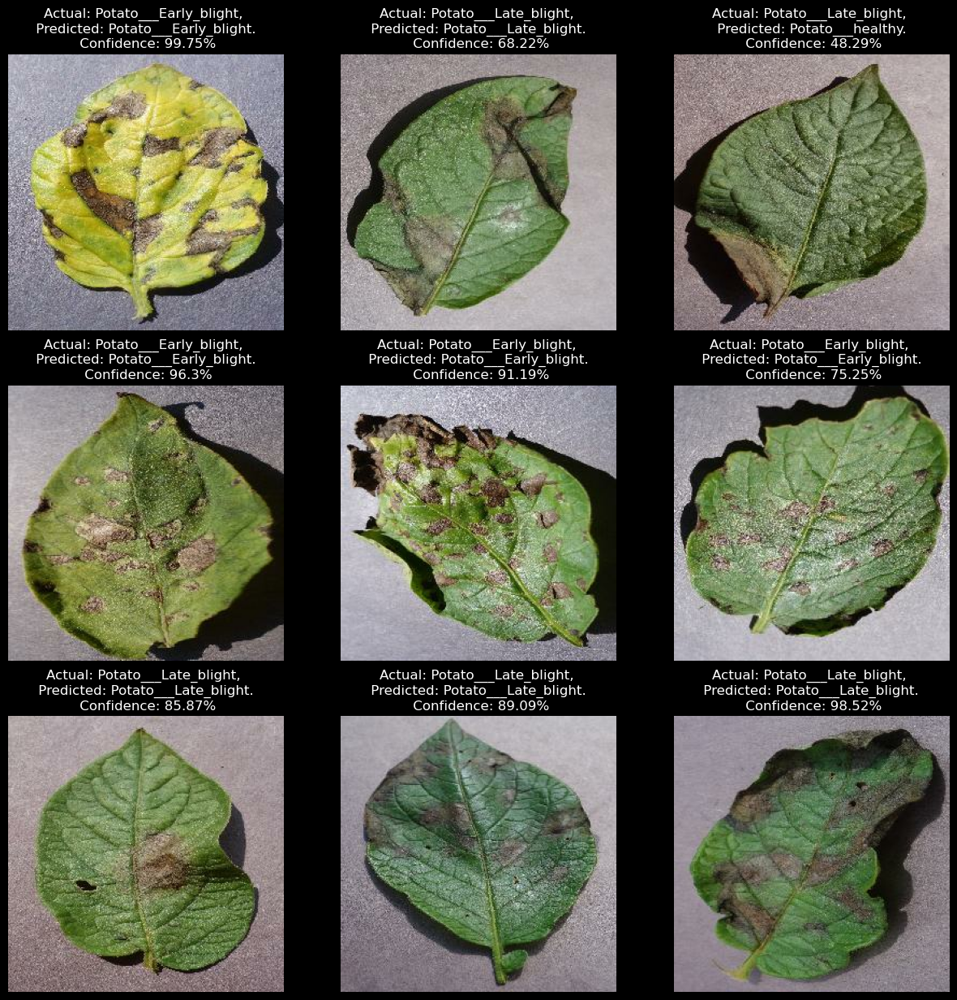

In [52]:
generalModel("./PlantVillage/", 4, 15)

Found 2152 files belonging to 3 classes.
Using 1507 files for training.
Using 645 files for validation.
Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_32 (Sequential)  (32, 256, 256, 3)         0         
                                                                 
 sequential_33 (Sequential)  (32, 256, 256, 3)         0         
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_3   (32, 1280)               0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_23 (Dropout)        (32, 1280)                0         
               

c:\Users\x2421\miniconda3\envs\tf\lib\site-packages\keras\backend.py:5582: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


48/48 [==============================] - 89s 2s/step - loss: 0.1946 - accuracy: 0.9297 - val_loss: 8.2950 - val_accuracy: 0.2769
Epoch 2/15
48/48 [==============================] - 80s 2s/step - loss: 0.0829 - accuracy: 0.9768 - val_loss: 4.6804 - val_accuracy: 0.6284
Epoch 3/15
48/48 [==============================] - 80s 2s/step - loss: 0.0299 - accuracy: 0.9920 - val_loss: 5.2914 - val_accuracy: 0.4317
Epoch 4/15
48/48 [==============================] - 81s 2s/step - loss: 0.0092 - accuracy: 0.9973 - val_loss: 5.7612 - val_accuracy: 0.4681
Epoch 5/15
48/48 [==============================] - 79s 2s/step - loss: 0.0152 - accuracy: 0.9954 - val_loss: 10.8419 - val_accuracy: 0.3898
Epoch 6/15
48/48 [==============================] - 80s 2s/step - loss: 0.0583 - accuracy: 0.9808 - val_loss: 1.1368 - val_accuracy: 0.9071
Epoch 7/15
48/48 [==============================] - 80s 2s/step - loss: 0.0664 - accuracy: 0.9768 - val_loss: 6.3067 - val_accuracy: 0.5373
Epoch 8/15
48/48 [============

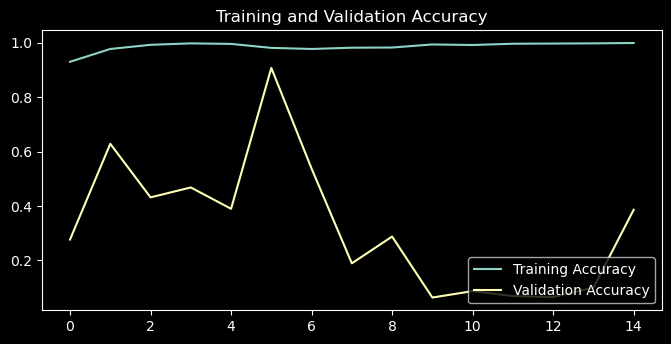

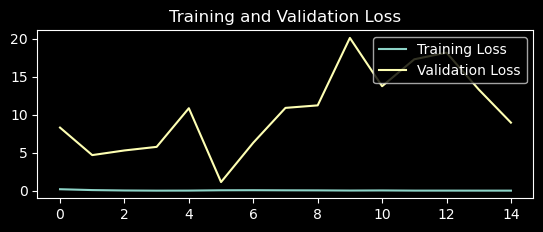

1/1 [==============================] - 0s 36ms/step
[[[46  2]
  [19 29]]

 [[52  0]
  [42  2]]

 [[33 59]
  [ 0  4]]]
                       precision    recall  f1-score   support

Potato___Early_blight       0.94      0.60      0.73        48
 Potato___Late_blight       1.00      0.05      0.09        44
     Potato___healthy       0.06      1.00      0.12         4

             accuracy                           0.36        96
            macro avg       0.67      0.55      0.31        96
         weighted avg       0.93      0.36      0.41        96

1/1 [==============================] - 0s 35ms/step


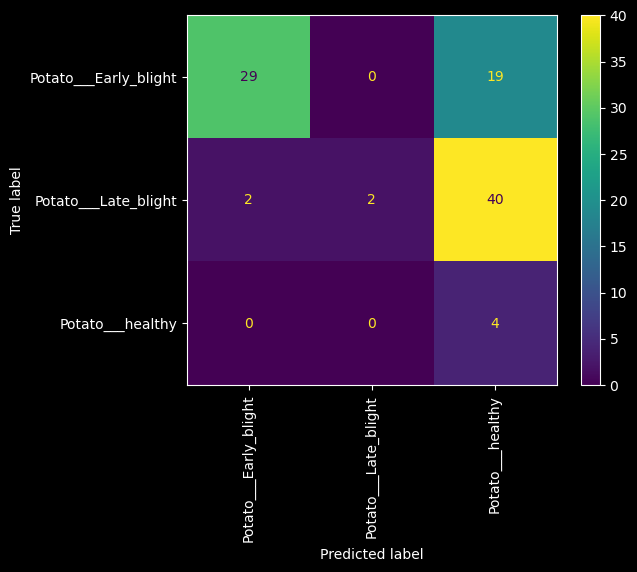

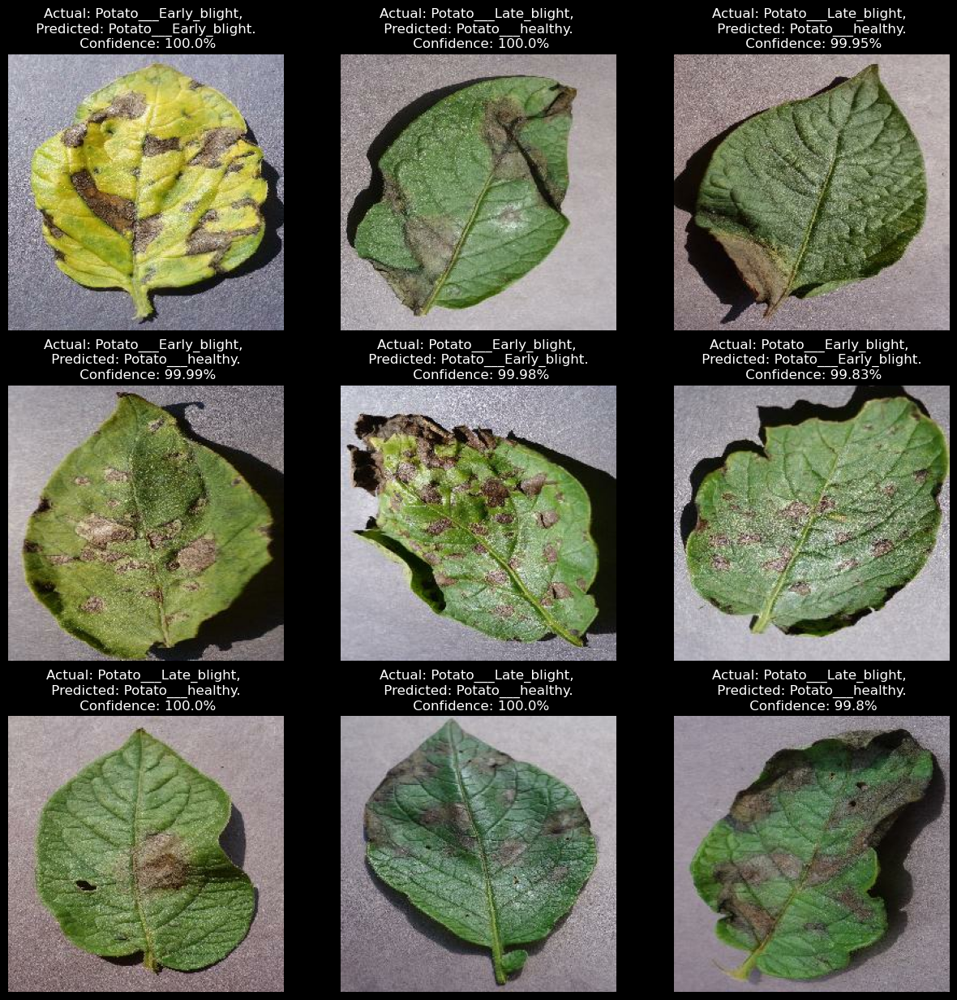

In [62]:
generalModel("./PlantVillage/", 5, 15)

Found 2152 files belonging to 3 classes.
Using 1507 files for training.
Using 645 files for validation.
Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_35 (Sequential)  (32, 256, 256, 3)         0         
                                                                 
 sequential_36 (Sequential)  (32, 256, 256, 3)         0         
                                                                 
 vgg19 (Functional)          (None, 8, 8, 512)         20024384  
                                                                 
 dropout_24 (Dropout)        (32, 8, 8, 512)           0         
                                                                 
 flatten_10 (Flatten)        (32, 32768)               0         
                                                                 
 dense_18 (Dense)            (32, 64)                  2097216   
               

c:\Users\x2421\miniconda3\envs\tf\lib\site-packages\keras\backend.py:5582: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


48/48 [==============================] - 219s 4s/step - loss: 1.2376 - accuracy: 0.7080 - val_loss: 0.3035 - val_accuracy: 0.8944
Epoch 2/15
48/48 [==============================] - 217s 5s/step - loss: 0.3058 - accuracy: 0.8806 - val_loss: 0.2576 - val_accuracy: 0.9144
Epoch 3/15
48/48 [==============================] - 214s 4s/step - loss: 0.2293 - accuracy: 0.9164 - val_loss: 0.2170 - val_accuracy: 0.9271
Epoch 4/15
48/48 [==============================] - 215s 5s/step - loss: 0.2088 - accuracy: 0.9197 - val_loss: 0.2140 - val_accuracy: 0.9253
Epoch 5/15
48/48 [==============================] - 214s 4s/step - loss: 0.1904 - accuracy: 0.9310 - val_loss: 0.2797 - val_accuracy: 0.8907
Epoch 6/15
48/48 [==============================] - 220s 5s/step - loss: 0.1596 - accuracy: 0.9502 - val_loss: 0.1971 - val_accuracy: 0.9271
Epoch 7/15
48/48 [==============================] - 227s 5s/step - loss: 0.1411 - accuracy: 0.9542 - val_loss: 0.1825 - val_accuracy: 0.9381
Epoch 8/15
48/48 [======

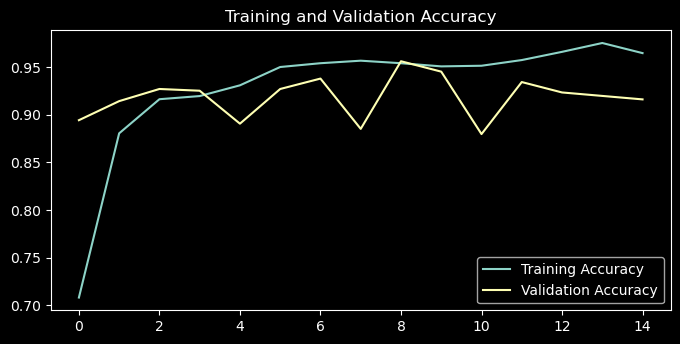

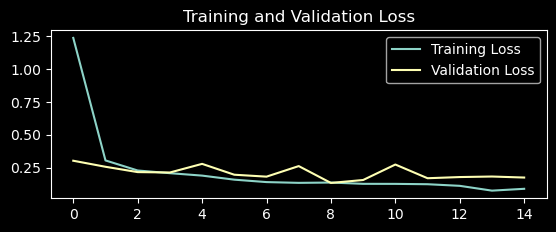

1/1 [==============================] - 0s 134ms/step
[[[48  0]
  [ 0 48]]

 [[52  0]
  [ 3 41]]

 [[89  3]
  [ 0  4]]]
                       precision    recall  f1-score   support

Potato___Early_blight       1.00      1.00      1.00        48
 Potato___Late_blight       1.00      0.93      0.96        44
     Potato___healthy       0.57      1.00      0.73         4

             accuracy                           0.97        96
            macro avg       0.86      0.98      0.90        96
         weighted avg       0.98      0.97      0.97        96

1/1 [==============================] - 0s 159ms/step


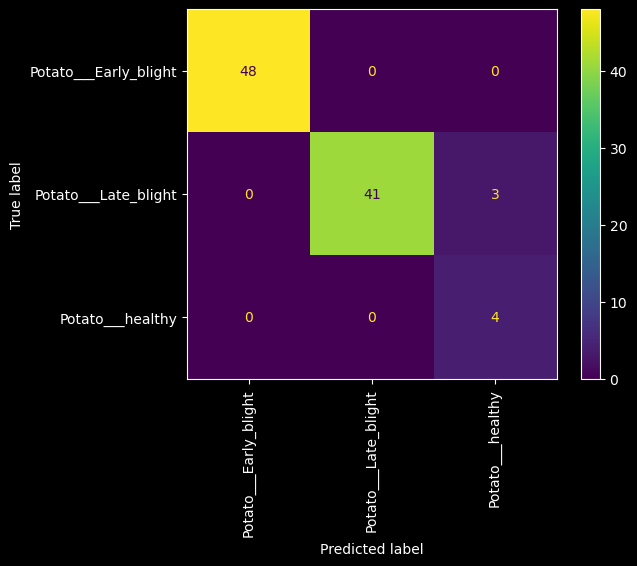

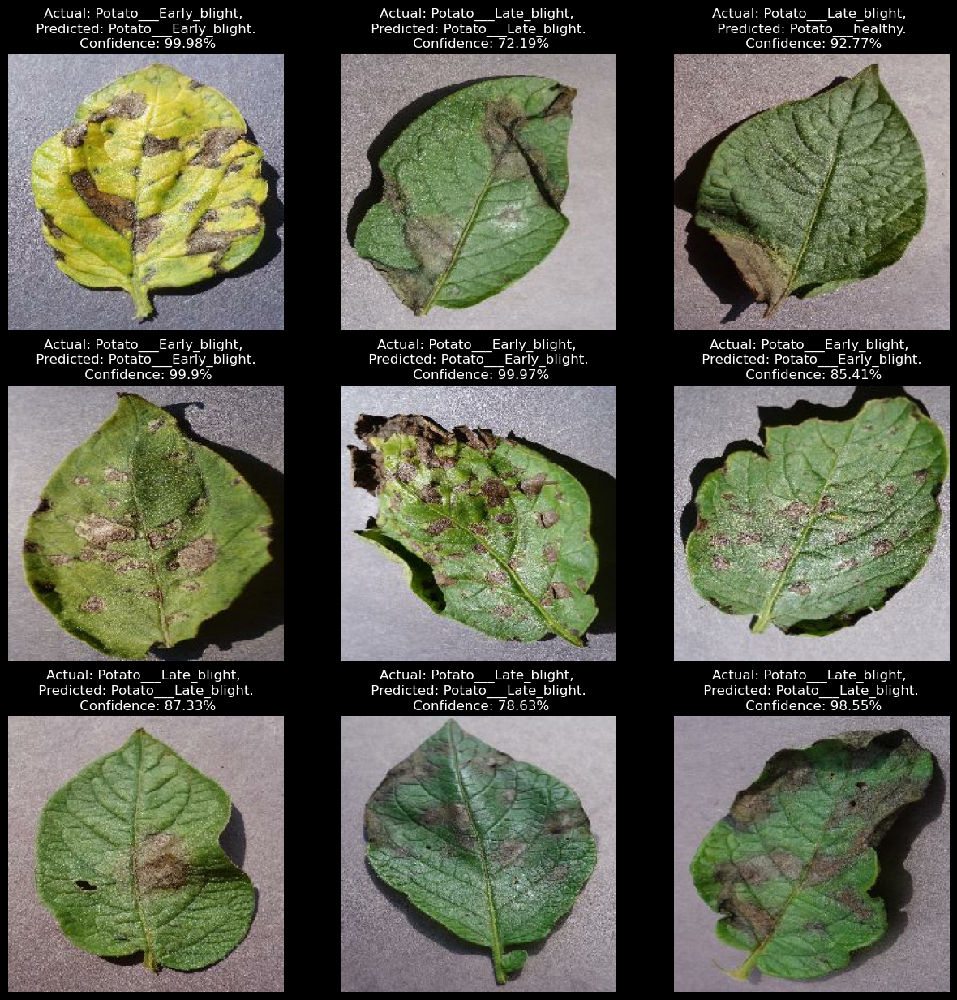

In [63]:
generalModel("./PlantVillage/", 6, 15)

In [ ]:
generalModel("./PlantVillage/", 7, 15)